In [ ]:
# Today, AI is everywhere, we are able to do many things with it.
# I will be exploring one of the key areas within AI, classification, which is a field currently under research, and we have not fully yet found out the limitations
# We've trained AI which can classify animals, plants, cars, and medicine, among other things.
# However, the main problem in hand revolves around the AI's capability to effectively classify manipulated images and the extent of training required to enable the AI to reliably detect these altered images.
# This is where the AI is most vulnerable as it is not able to adapt quickly to evolving image manipulation techniques and this is what I will be aiming to research and come to a solution where I aim to see how easily I can manipulate the AI into classifying the hacked images.
# Dogs and Cats Dataset

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.1.incompleteX515EK/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.
9406464/9406464 [==============================] - 0s 0us/step
Epoch 1/20
582/582 [==============================] - 84s 129ms/step - loss: 0.2021 - accuracy: 0.9181 - val_loss: 0.1296 - val_accuracy: 0.9518
Epoch 2/20
582/582 [==============================] - 73s 125ms/step - loss: 0.1566 - accuracy: 0.9350 - val_loss: 0.1227 - val_accuracy: 0.9536
Epoch 3/20
582/582 [==============================] - 72s 124ms/step - loss: 0.1511 - accuracy: 0.9388 - val_loss: 0.1092 - val_accuracy: 0.9577
Epoch 4/20
582/582 [==============================] - 72s 124ms/step - loss: 0.1409 - accuracy: 0.9442 - val_loss: 0.1164 - val_accuracy: 0.9553
Epoch 5/20
582/582 [==============================] - 73s 126ms/step - loss: 0.1386 - accuracy: 0.9436 - val_loss: 0.1095 - val_accuracy: 0.9581
Epoch 6/20
582/582 [==============================] - 72s 123ms/step - loss: 0.

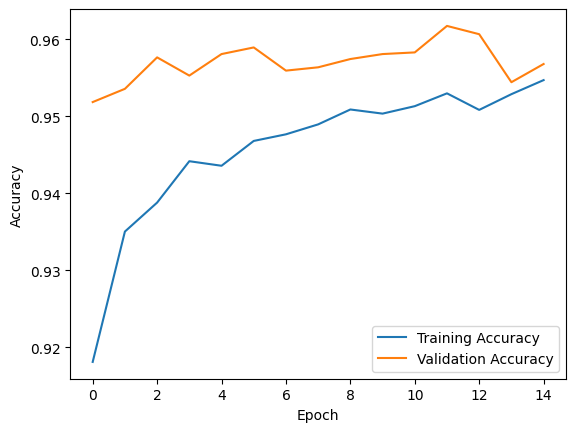

1/1 [==============================] - 1s 854ms/step


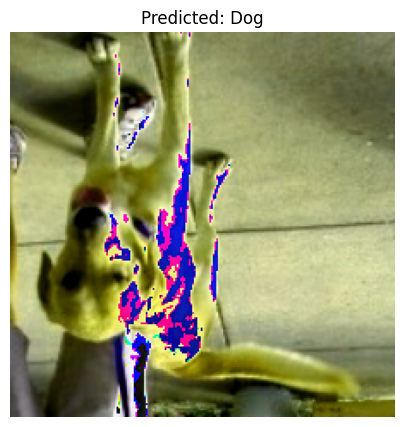

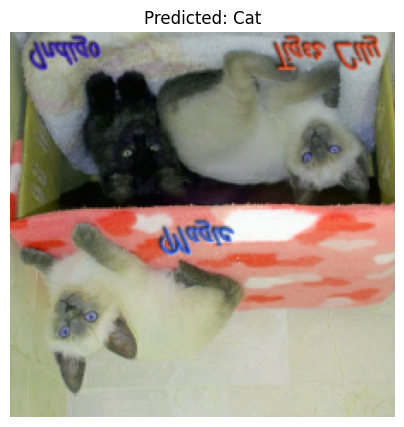

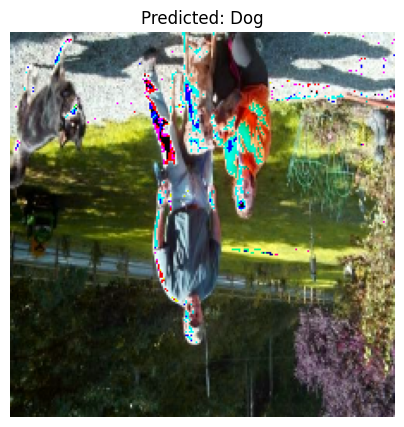

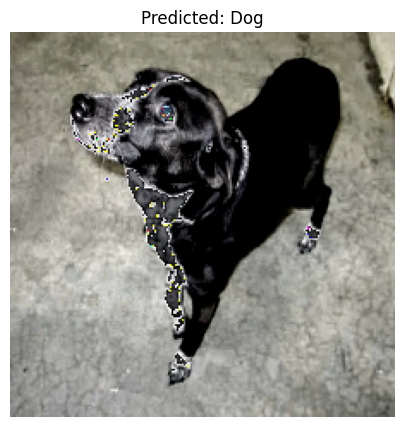

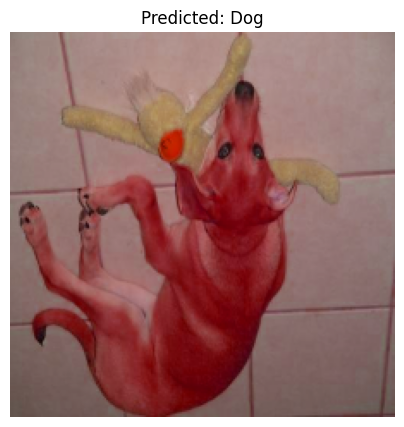

...

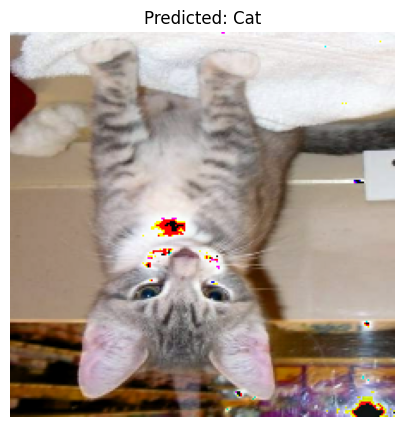

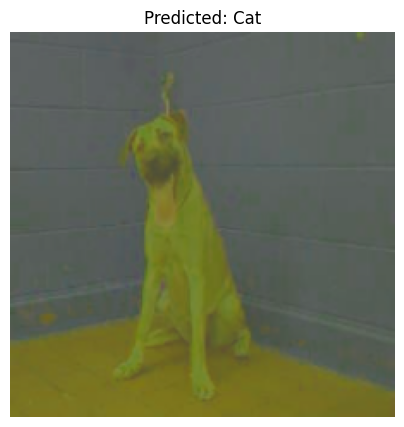

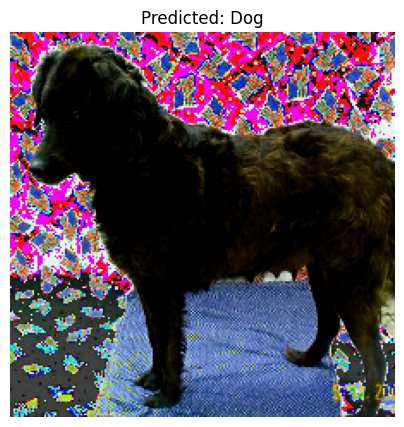

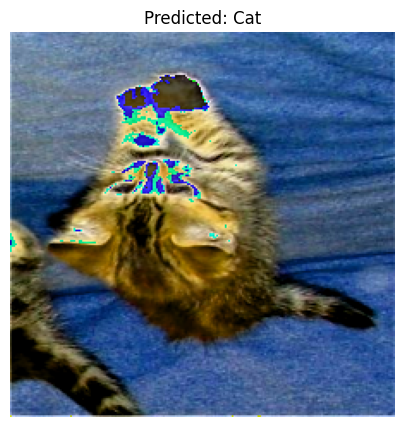

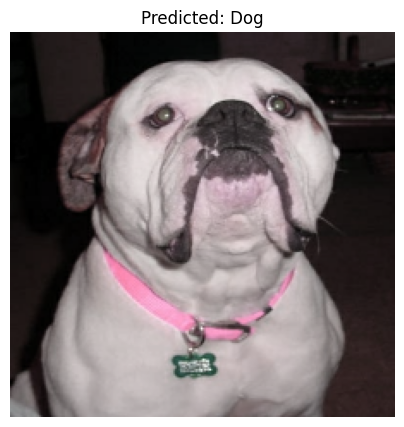

1/1 [==============================] - 0s 59ms/step


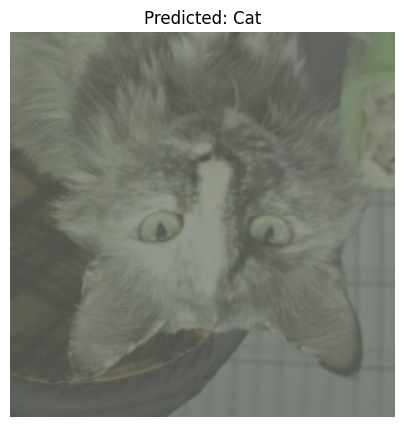

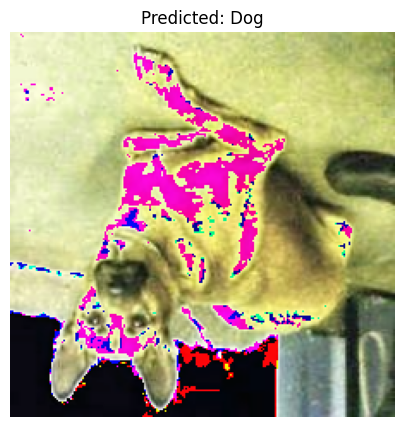

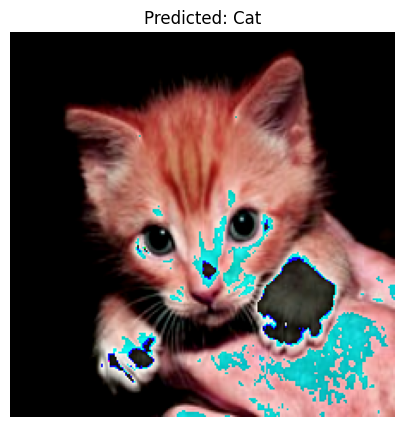

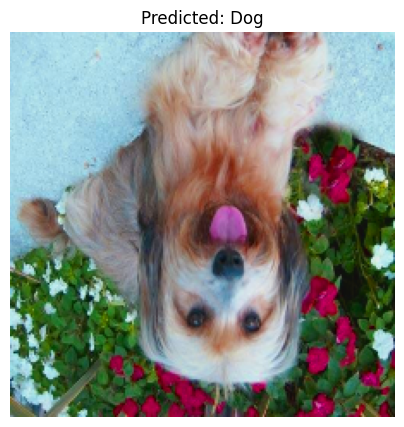

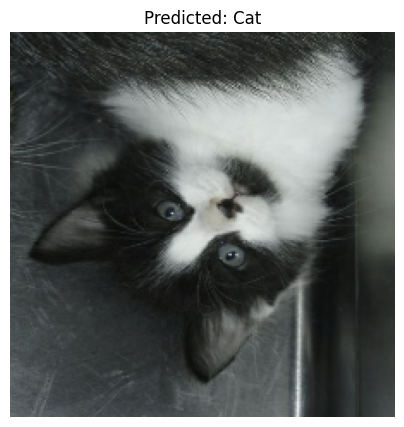

...

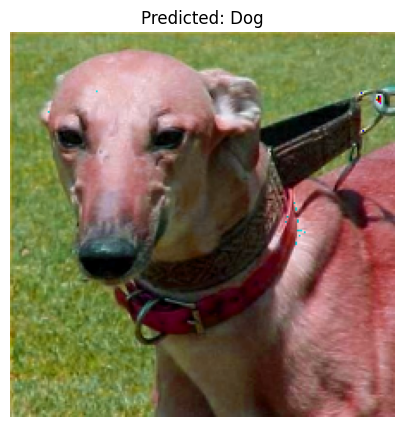

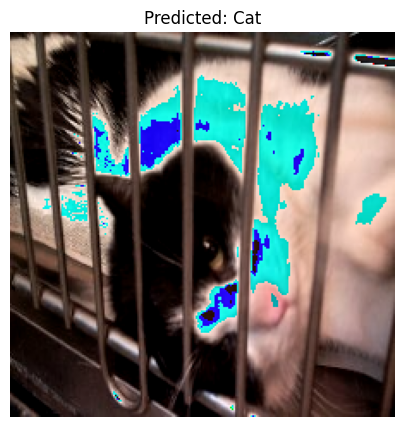

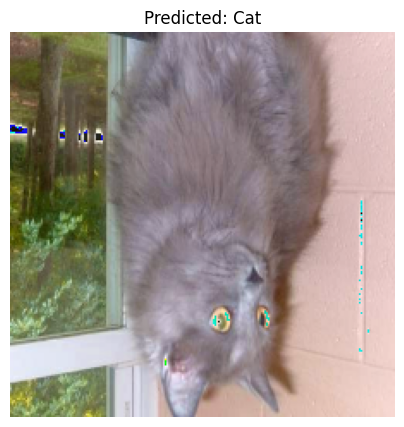

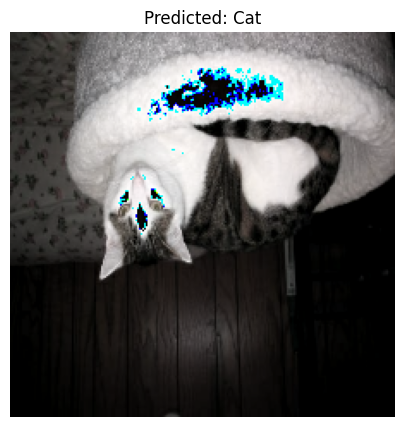

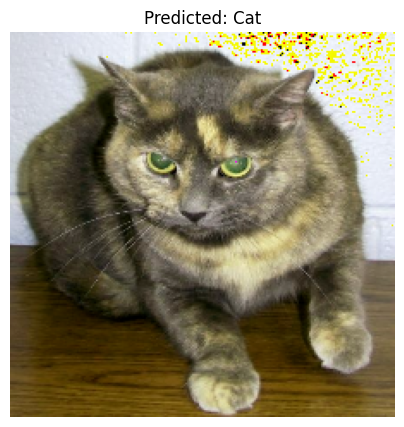

1/1 [==============================] - 0s 102ms/step


In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
(train_ds, test_ds), info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:]'],
    with_info=True,
    as_supervised=True,
)
def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.2, upper=1.8)
    image = tf.image.random_hue(image, max_delta=0.1)
    image = tf.image.random_saturation(image, lower=0.2, upper=1.8)
    image = preprocess_input(image)
    return image, label
train_ds = train_ds.map(preprocess_image)
test_ds = test_ds.map(preprocess_image)
batch_size = 32
train_ds = train_ds.batch(batch_size)
test_ds = test_ds.batch(batch_size)
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    #Dropout(0.5),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
history = model.fit(train_ds, epochs=20, validation_data=test_ds, callbacks=[early_stopping])
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
def display_images_with_predictions(model, dataset, num_images=5):
    for images, labels in dataset.take(num_images):
        reversed_images = (images + 1.0) / 2.0 * 255.0
        reversed_images = tf.cast(reversed_images, tf.uint8)
        predictions = model.predict(images)
        for i in range(images.shape[0]):
            image = reversed_images[i].numpy()
            predicted_class = np.round(predictions[i])
            plt.figure(figsize=(5, 5))
            plt.imshow(image)
            class_name = 'Dog' if predicted_class == 1 else 'Cat'
            plt.title(f"Predicted: {class_name}")
            plt.axis('off')
            plt.show()
display_images_with_predictions(model, test_ds)
#Here is my attempt to classify correctly, which I have been able to do because I fine tuned the model, as we know we are never able to get 1OO% test accuracy so the model will never be 1OO% accurate, so we are able to get good results in this model which is showing that it can classify correctly


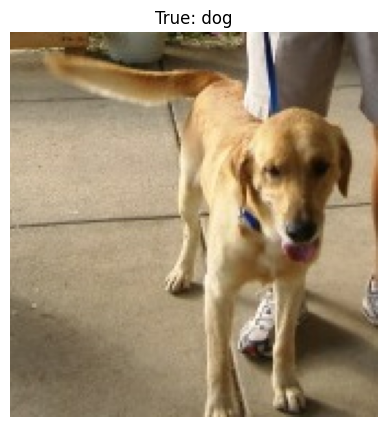

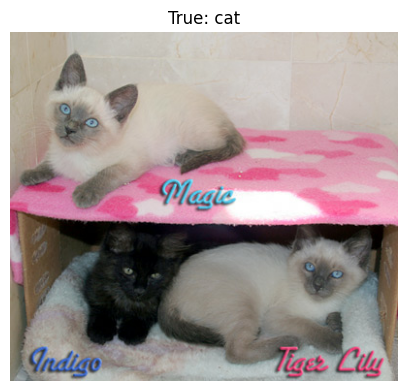

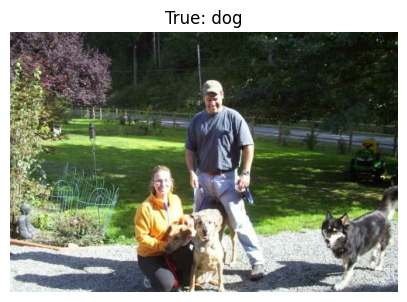

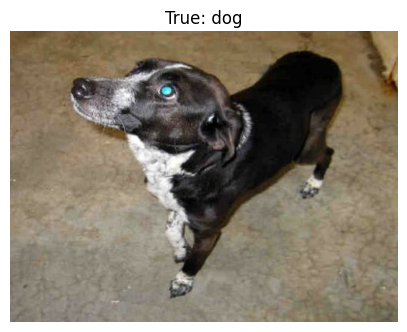

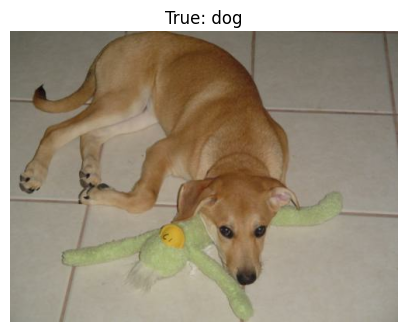

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
# Load the Kaggle Cats vs. Dogs dataset using TensorFlow Datasets
(train_ds, test_ds), info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:]'],
    with_info=True,
    as_supervised=True,
)
# Functioning the images which are displayed with true labels if it is a dog/cat
def display_images(dataset, num_images=5):
    for i, (image, label) in enumerate(dataset.take(num_images)):
        plt.figure(figsize=(5, 5))
        plt.imshow(image.numpy().astype(np.uint8))
        plt.title(f"True: {info.features['label'].int2str(label.numpy())}")
        plt.axis('off')
        plt.show()
display_images(test_ds)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>